1 Q) Perform Clustering(Hierarchical, Kmeans & DBSCAN) for the crime data and identify the number of clusters formed and draw inferences.

Data Description:
Murder -- Muder rates in different places of United States
Assualt- Assualt rate in different places of United States
UrbanPop - urban population in different places of United States
Rape - Rape rate in different places of United States


In [1]:
import pandas as pd
import numpy as np

In [2]:
crime = pd.read_csv(r"C:\Users\Aruna\Desktop\Assgnmnts-DS\Clustering-7\crime_data.csv")

In [3]:
crime.head()

,Unnamed: 0,Murder,Assault,UrbanPop,Rape
0,Alabama,13.2,236,58,21.2
1,Alaska,10.0,263,48,44.5
2,Arizona,8.1,294,80,31.0
3,Arkansas,8.8,190,50,19.5
4,California,9.0,276,91,40.6


In [4]:
crime.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50 entries, 0 to 49
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  50 non-null     object 
 1   Murder      50 non-null     float64
 2   Assault     50 non-null     int64  
 3   UrbanPop    50 non-null     int64  
 4   Rape        50 non-null     float64
dtypes: float64(2), int64(2), object(1)
memory usage: 2.1+ KB


In [5]:
crime.isnull().sum()

Unnamed: 0    0
Murder        0
Assault       0
UrbanPop      0
Rape          0
dtype: int64

In [6]:
crime.corr()

C:\Users\Aruna\AppData\Local\Temp\ipykernel_428\2959462628.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  crime.corr()


,Murder,Assault,UrbanPop,Rape
Murder,1.000000,0.801873,0.069573,0.563579
Assault,0.801873,1.000000,0.258872,0.665241
UrbanPop,0.069573,0.258872,1.000000,0.411341
Rape,0.563579,0.665241,0.411341,1.000000


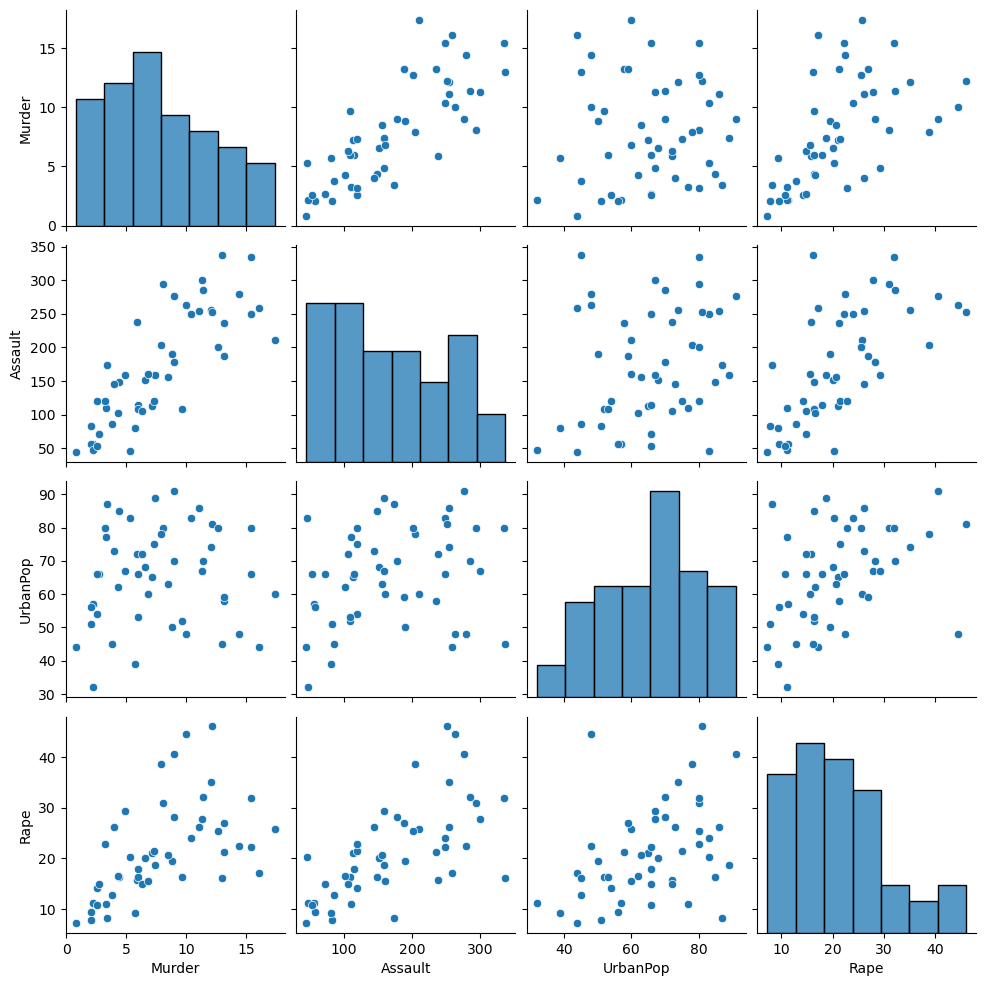

In [7]:
import seaborn as sns

sns.pairplot(crime)

In [8]:
# Normalization of data values
def norm_func(i):
    x = (i-i.min())/(i.max()-i.min())
    print(x)
    return x

In [9]:
crime1 = norm_func(crime.iloc[:,1:])

      Murder   Assault  UrbanPop      Rape
0   0.746988  0.654110  0.440678  0.359173
1   0.554217  0.746575  0.271186  0.961240
2   0.439759  0.852740  0.813559  0.612403
3   0.481928  0.496575  0.305085  0.315245
4   0.493976  0.791096  1.000000  0.860465
5   0.427711  0.544521  0.779661  0.811370
6   0.150602  0.222603  0.762712  0.098191
7   0.307229  0.660959  0.677966  0.219638
8   0.879518  0.993151  0.813559  0.635659
9   1.000000  0.568493  0.474576  0.478036
10  0.271084  0.003425  0.864407  0.333333
11  0.108434  0.256849  0.372881  0.178295
12  0.578313  0.698630  0.864407  0.431525
13  0.385542  0.232877  0.559322  0.354005
14  0.084337  0.037671  0.423729  0.103359
15  0.313253  0.239726  0.576271  0.276486
16  0.536145  0.219178  0.338983  0.232558
17  0.879518  0.698630  0.576271  0.385013
18  0.078313  0.130137  0.322034  0.012920
19  0.632530  0.873288  0.593220  0.529716
20  0.216867  0.356164  0.898305  0.232558
21  0.680723  0.719178  0.711864  0.718346
22  0.11445

# 1) hierarchical clustering

In [10]:
# import hierarchical clustering libraries
import scipy.cluster.hierarchy as sch 

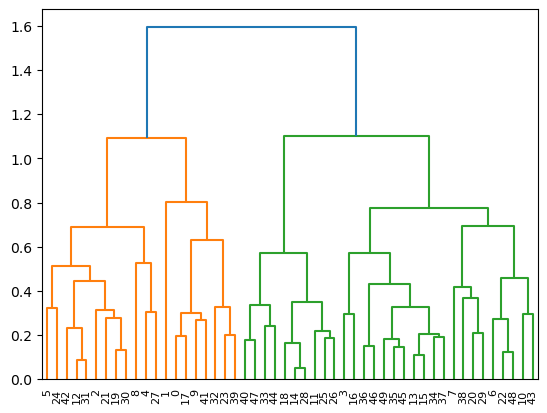

In [11]:
# Creating a dendrogram for hierarchical clustering
dendrogram = sch.dendrogram(sch.linkage(crime1, method='complete'))

In [12]:
from sklearn.cluster import AgglomerativeClustering

In [13]:
# create clusters
hc = AgglomerativeClustering(n_clusters=5, affinity = 'euclidean', linkage = 'complete',distance_threshold=None)

In [14]:
# fitting model
hc.fit(crime1)

C:\Users\Aruna\anaconda3\Lib\site-packages\sklearn\cluster\_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


AgglomerativeClustering(affinity='euclidean', linkage='complete', n_clusters=5)

In [15]:
# predicting data
hc_pred = hc.fit_predict(crime1)

C:\Users\Aruna\anaconda3\Lib\site-packages\sklearn\cluster\_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


In [16]:
hc_pred

array([3, 4, 1, 0, 1, 1, 0, 0, 1, 3, 0, 2, 1, 0, 2, 0, 0, 3, 2, 1, 0, 1,
       0, 3, 1, 2, 2, 1, 2, 0, 1, 1, 3, 2, 0, 0, 0, 0, 0, 3, 2, 3, 1, 0,
       2, 0, 0, 2, 0, 0], dtype=int64)

In [17]:
set(hc_pred)

{0, 1, 2, 3, 4}

In [18]:
crime["hc_id"] = hc_pred

In [19]:
crime

,Unnamed: 0,Murder,Assault,UrbanPop,Rape,hc_id
0,Alabama,13.2,236,58,21.2,3
1,Alaska,10.0,263,48,44.5,4
2,Arizona,8.1,294,80,31.0,1
3,Arkansas,8.8,190,50,19.5,0
4,California,9.0,276,91,40.6,1
5,Colorado,7.9,204,78,38.7,1
6,Connecticut,3.3,110,77,11.1,0
7,Delaware,5.9,238,72,15.8,0
8,Florida,15.4,335,80,31.9,1
9,Georgia,17.4,211,60,25.8,3


In [20]:
# sorting values based on hc_id
crime.sort_values('hc_id')

,Unnamed: 0,Murder,Assault,UrbanPop,Rape,hc_id
49,Wyoming,6.8,161,60,15.6,0
20,Massachusetts,4.4,149,85,16.3,0
29,New Jersey,7.4,159,89,18.8,0
16,Kentucky,9.7,109,52,16.3,0
15,Kansas,6.0,115,66,18.0,0
34,Ohio,7.3,120,75,21.4,0
13,Indiana,7.2,113,65,21.0,0
35,Oklahoma,6.6,151,68,20.0,0
22,Minnesota,2.7,72,66,14.9,0
10,Hawaii,5.3,46,83,20.2,0


In [21]:
crime.groupby("hc_id").mean()

C:\Users\Aruna\AppData\Local\Temp\ipykernel_428\3063688534.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  crime.groupby("hc_id").mean()


,Murder,Assault,UrbanPop,Rape
hc_id,,,,
0,5.715000,132.300000,70.800000,18.100000
1,10.883333,256.916667,78.333333,32.250000
2,3.180000,78.700000,49.300000,11.630000
3,14.671429,251.285714,54.285714,21.685714
4,10.000000,263.000000,48.000000,44.500000


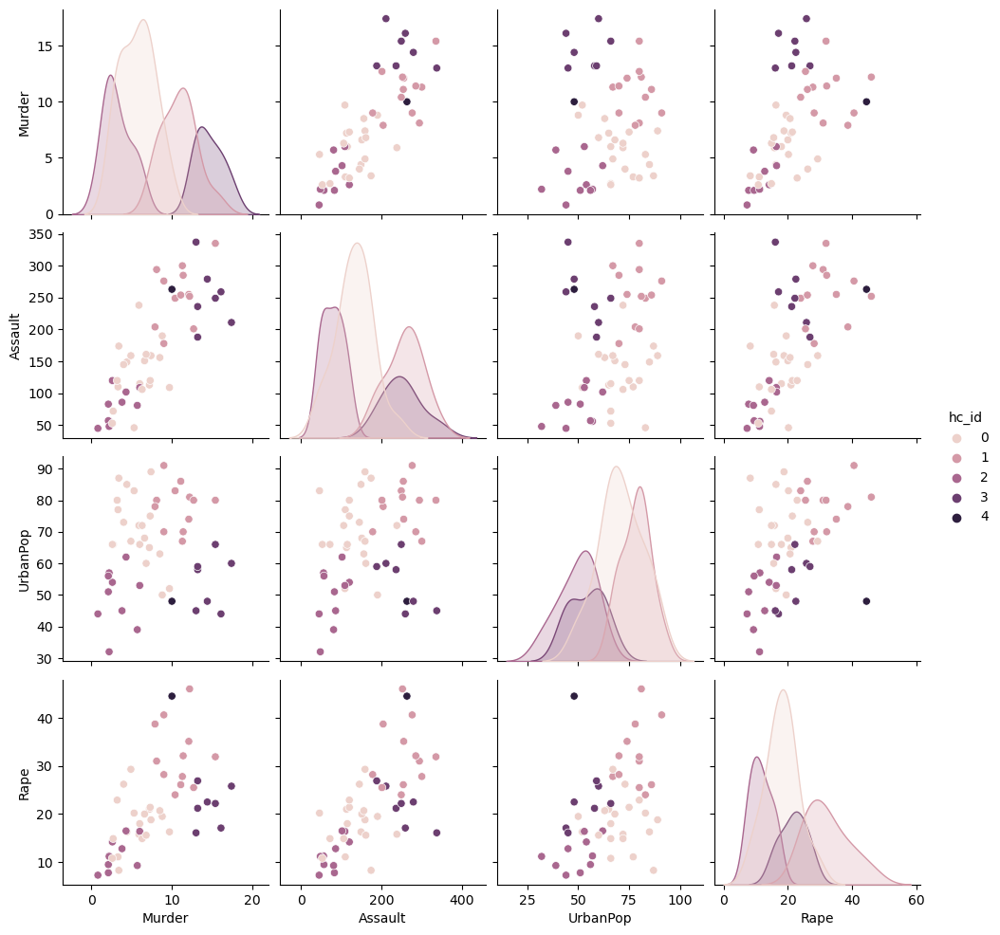

In [22]:
sns.pairplot(data=crime,hue="hc_id")

# K-means Clustering

In [23]:
import warnings
warnings.filterwarnings("ignore")
from sklearn.cluster import KMeans

In [ ]:
#The K-means algorithm aims to choose centroids that minimise the inertia, or within-cluster sum-of-squares criterion:

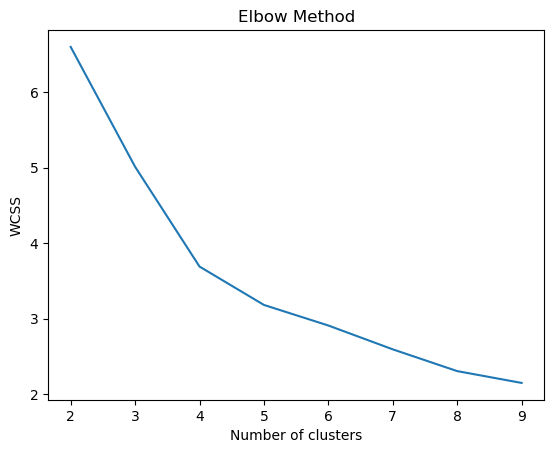

In [25]:
wcss = []
for i in range(2, 10):
    
    kmeans = KMeans(n_clusters=i,random_state=42 )
    kmeans.fit(crime1)
    wcss.append(kmeans.inertia_)

# plottung Elbow plot
import matplotlib.pyplot as plt
plt.plot(range(2, 10), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

In [26]:
#Building Cluster algorithm
clusters = KMeans(5, random_state=42)
clusters.fit(crime1)

KMeans(n_clusters=5, random_state=42)

In [27]:
clusters.labels_

array([4, 1, 1, 2, 1, 1, 0, 2, 1, 4, 0, 3, 1, 2, 3, 2, 2, 4, 3, 1, 0, 1,
       3, 4, 2, 2, 2, 1, 3, 0, 1, 1, 4, 3, 0, 2, 2, 0, 0, 4, 3, 4, 1, 0,
       3, 2, 0, 3, 3, 2])

In [28]:
set (clusters.labels_)

{0, 1, 2, 3, 4}

In [31]:
# Assigning culster numbers to the data set
crime["cluster_id"] = clusters.labels_

In [32]:
crime

,Unnamed: 0,Murder,Assault,UrbanPop,Rape,hc_id,cluster_id
0,Alabama,13.2,236,58,21.2,3,4
1,Alaska,10.0,263,48,44.5,4,1
2,Arizona,8.1,294,80,31.0,1,1
3,Arkansas,8.8,190,50,19.5,0,2
4,California,9.0,276,91,40.6,1,1
5,Colorado,7.9,204,78,38.7,1,1
6,Connecticut,3.3,110,77,11.1,0,0
7,Delaware,5.9,238,72,15.8,0,2
8,Florida,15.4,335,80,31.9,1,1
9,Georgia,17.4,211,60,25.8,3,4


In [36]:
crime2 = crime.drop('hc_id',axis = 1)

In [37]:
crime2.sort_values('cluster_id')

,Unnamed: 0,Murder,Assault,UrbanPop,Rape,cluster_id
10,Hawaii,5.3,46,83,20.2,0
34,Ohio,7.3,120,75,21.4,0
37,Pennsylvania,6.3,106,72,14.9,0
38,Rhode Island,3.4,174,87,8.3,0
43,Utah,3.2,120,80,22.9,0
29,New Jersey,7.4,159,89,18.8,0
20,Massachusetts,4.4,149,85,16.3,0
46,Washington,4.0,145,73,26.2,0
6,Connecticut,3.3,110,77,11.1,0
5,Colorado,7.9,204,78,38.7,1


In [45]:
# These are Standerdized values
cluster_center = clusters.cluster_centers_
cluster_center

array([[0.25033467, 0.27549467, 0.81544256, 0.27103072],
       [0.6124498 , 0.75      , 0.75423729, 0.67980189],
       [0.37198795, 0.35416667, 0.51412429, 0.32235142],
       [0.11325301, 0.0859589 , 0.3220339 , 0.09328165],
       [0.83562823, 0.70645793, 0.37772397, 0.37172388]])

In [41]:
# Quality of clusters is expressed in terms of Silhoutte score

from sklearn.metrics import silhouette_score
score =silhouette_score(crime1, kmeans.labels_ , metric='euclidean')
score

0.11052641511543135

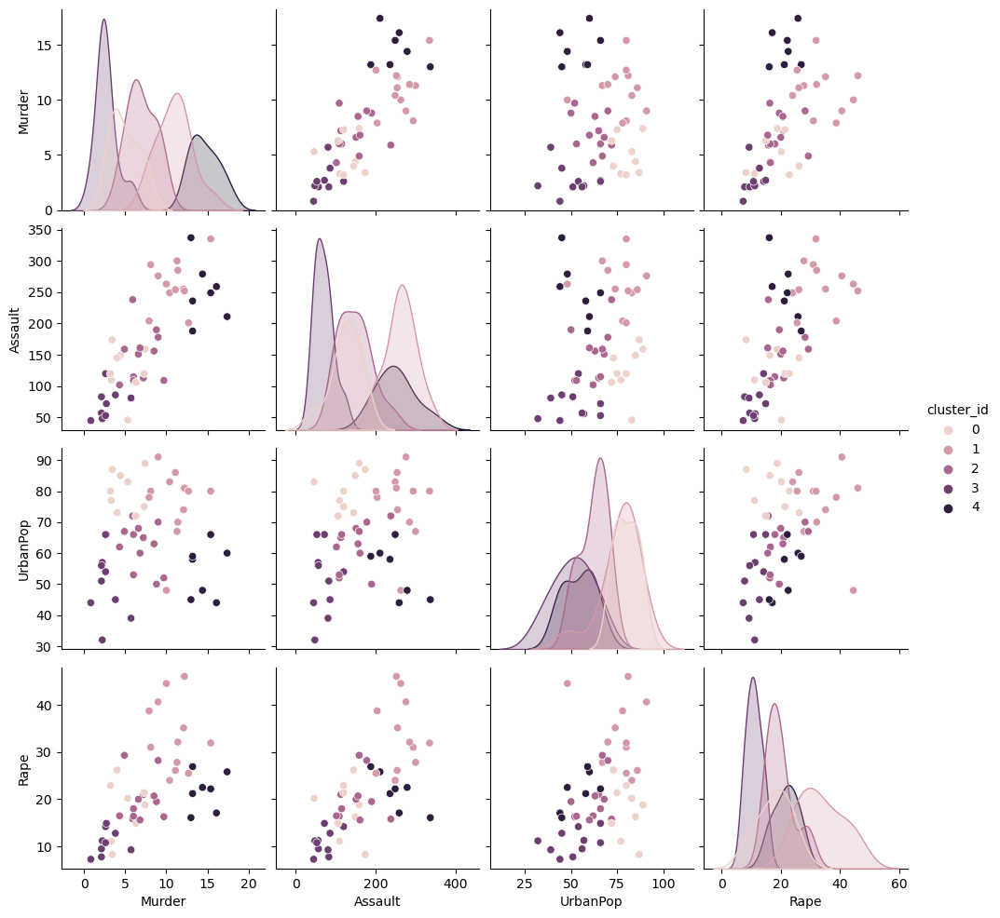

In [42]:
sns.pairplot(data=crime2, hue='cluster_id')

# DBSCAN

In [48]:
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler

In [53]:
crimedb = pd.read_csv(r"C:\Users\Aruna\Desktop\Assgnmnts-DS\Clustering-7\crime_data.csv")

In [54]:
crimedb.head()

,Unnamed: 0,Murder,Assault,UrbanPop,Rape
0,Alabama,13.2,236,58,21.2
1,Alaska,10.0,263,48,44.5
2,Arizona,8.1,294,80,31.0
3,Arkansas,8.8,190,50,19.5
4,California,9.0,276,91,40.6


In [56]:
crimedb1 = crimedb.iloc[:,1:]

In [58]:
array = crimedb1.values
array

array([[ 13.2, 236. ,  58. ,  21.2],
       [ 10. , 263. ,  48. ,  44.5],
       [  8.1, 294. ,  80. ,  31. ],
       [  8.8, 190. ,  50. ,  19.5],
       [  9. , 276. ,  91. ,  40.6],
       [  7.9, 204. ,  78. ,  38.7],
       [  3.3, 110. ,  77. ,  11.1],
       [  5.9, 238. ,  72. ,  15.8],
       [ 15.4, 335. ,  80. ,  31.9],
       [ 17.4, 211. ,  60. ,  25.8],
       [  5.3,  46. ,  83. ,  20.2],
       [  2.6, 120. ,  54. ,  14.2],
       [ 10.4, 249. ,  83. ,  24. ],
       [  7.2, 113. ,  65. ,  21. ],
       [  2.2,  56. ,  57. ,  11.3],
       [  6. , 115. ,  66. ,  18. ],
       [  9.7, 109. ,  52. ,  16.3],
       [ 15.4, 249. ,  66. ,  22.2],
       [  2.1,  83. ,  51. ,   7.8],
       [ 11.3, 300. ,  67. ,  27.8],
       [  4.4, 149. ,  85. ,  16.3],
       [ 12.1, 255. ,  74. ,  35.1],
       [  2.7,  72. ,  66. ,  14.9],
       [ 16.1, 259. ,  44. ,  17.1],
       [  9. , 178. ,  70. ,  28.2],
       [  6. , 109. ,  53. ,  16.4],
       [  4.3, 102. ,  62. ,  16.5],
 

In [60]:
scaler = StandardScaler()
x = scaler.fit_transform(array)

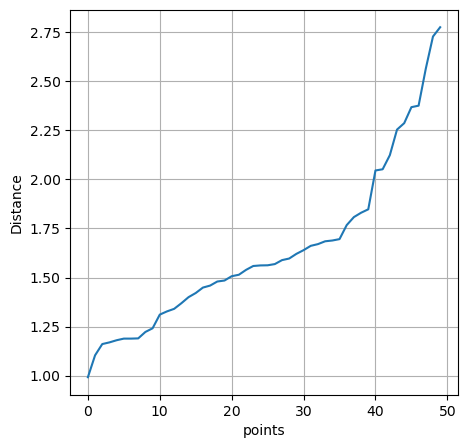

In [61]:
from sklearn.neighbors import NearestNeighbors
import numpy as np
import matplotlib.pyplot as plt
nearest_neighbors = NearestNeighbors(n_neighbors=20)
neighbors = nearest_neighbors.fit(x)

distances, indices = neighbors.kneighbors(x)
distances=np.sort(distances[:,10],axis=0)
fig=plt.figure(figsize=(5, 5))
plt.plot(distances)
plt.xlabel("points")
plt.ylabel("Distance")
plt.grid()

In [62]:
dbscan = DBSCAN(eps=1.30, min_samples=5)
clusters = dbscan.fit_predict(x)

In [63]:
dbscan.labels_

array([ 0, -1,  0,  0, -1,  0,  0,  0, -1,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, -1,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
      dtype=int64)

In [64]:
crimedb["cluster_id"] = dbscan.labels_

In [65]:
crimedb

,Unnamed: 0,Murder,Assault,UrbanPop,Rape,cluster_id
0,Alabama,13.2,236,58,21.2,0
1,Alaska,10.0,263,48,44.5,-1
2,Arizona,8.1,294,80,31.0,0
3,Arkansas,8.8,190,50,19.5,0
4,California,9.0,276,91,40.6,-1
5,Colorado,7.9,204,78,38.7,0
6,Connecticut,3.3,110,77,11.1,0
7,Delaware,5.9,238,72,15.8,0
8,Florida,15.4,335,80,31.9,-1
9,Georgia,17.4,211,60,25.8,0


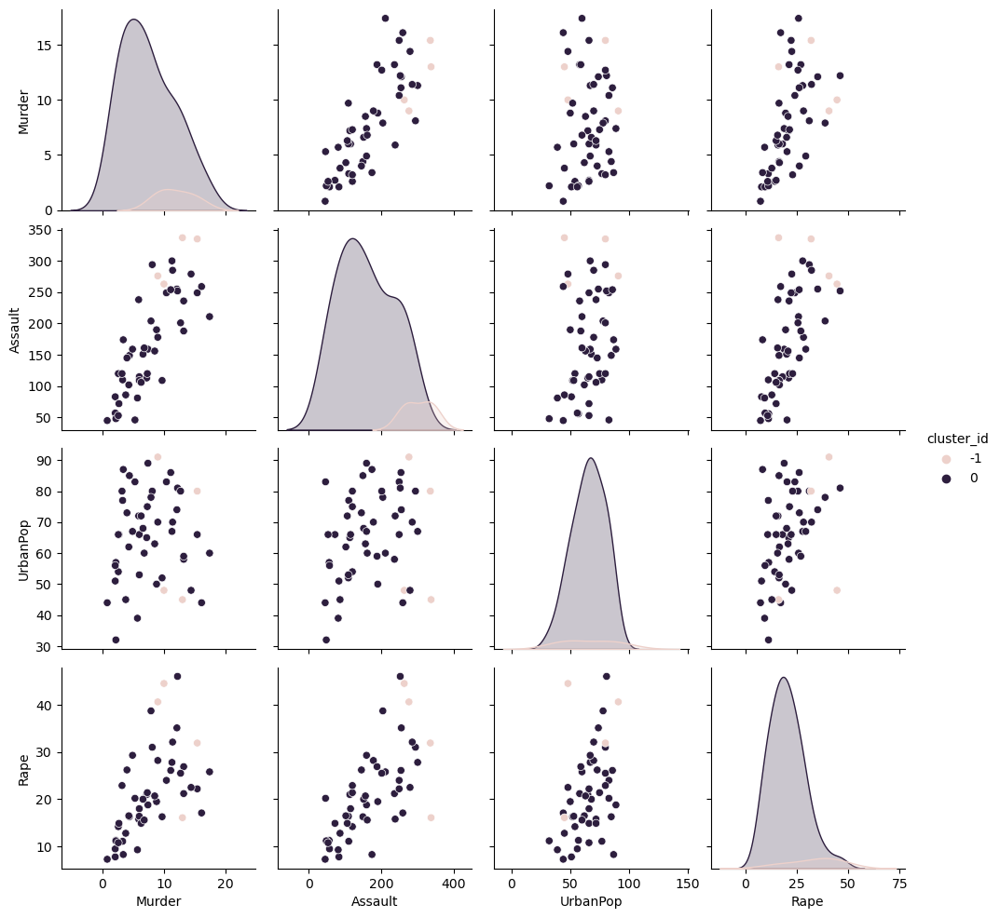

In [68]:
sns.pairplot(data=crimedb,hue='cluster_id')

2 Q) Perform clustering (hierarchical,K means clustering and DBSCAN) for the airlines data to obtain optimum number of clusters. 
Draw the inferences from the clusters obtained.

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns

In [2]:
airlines = pd.read_csv(r"C:\Users\Aruna\Desktop\Assgnmnts-DS\Clustering-7\EastWestAirlines.csv")

In [3]:
airlines.head()

,ID#,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
0,1,28143,0,1,1,1,174,1,0,0,7000,0
1,2,19244,0,1,1,1,215,2,0,0,6968,0
2,3,41354,0,1,1,1,4123,4,0,0,7034,0
3,4,14776,0,1,1,1,500,1,0,0,6952,0
4,5,97752,0,4,1,1,43300,26,2077,4,6935,1


In [4]:
airlines.isnull().sum()

ID#                  0
Balance              0
Qual_miles           0
cc1_miles            0
cc2_miles            0
cc3_miles            0
Bonus_miles          0
Bonus_trans          0
Flight_miles_12mo    0
Flight_trans_12      0
Days_since_enroll    0
Award?               0
dtype: int64

In [5]:
airlines.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3999 entries, 0 to 3998
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype
---  ------             --------------  -----
 0   ID#                3999 non-null   int64
 1   Balance            3999 non-null   int64
 2   Qual_miles         3999 non-null   int64
 3   cc1_miles          3999 non-null   int64
 4   cc2_miles          3999 non-null   int64
 5   cc3_miles          3999 non-null   int64
 6   Bonus_miles        3999 non-null   int64
 7   Bonus_trans        3999 non-null   int64
 8   Flight_miles_12mo  3999 non-null   int64
 9   Flight_trans_12    3999 non-null   int64
 10  Days_since_enroll  3999 non-null   int64
 11  Award?             3999 non-null   int64
dtypes: int64(12)
memory usage: 375.0 KB


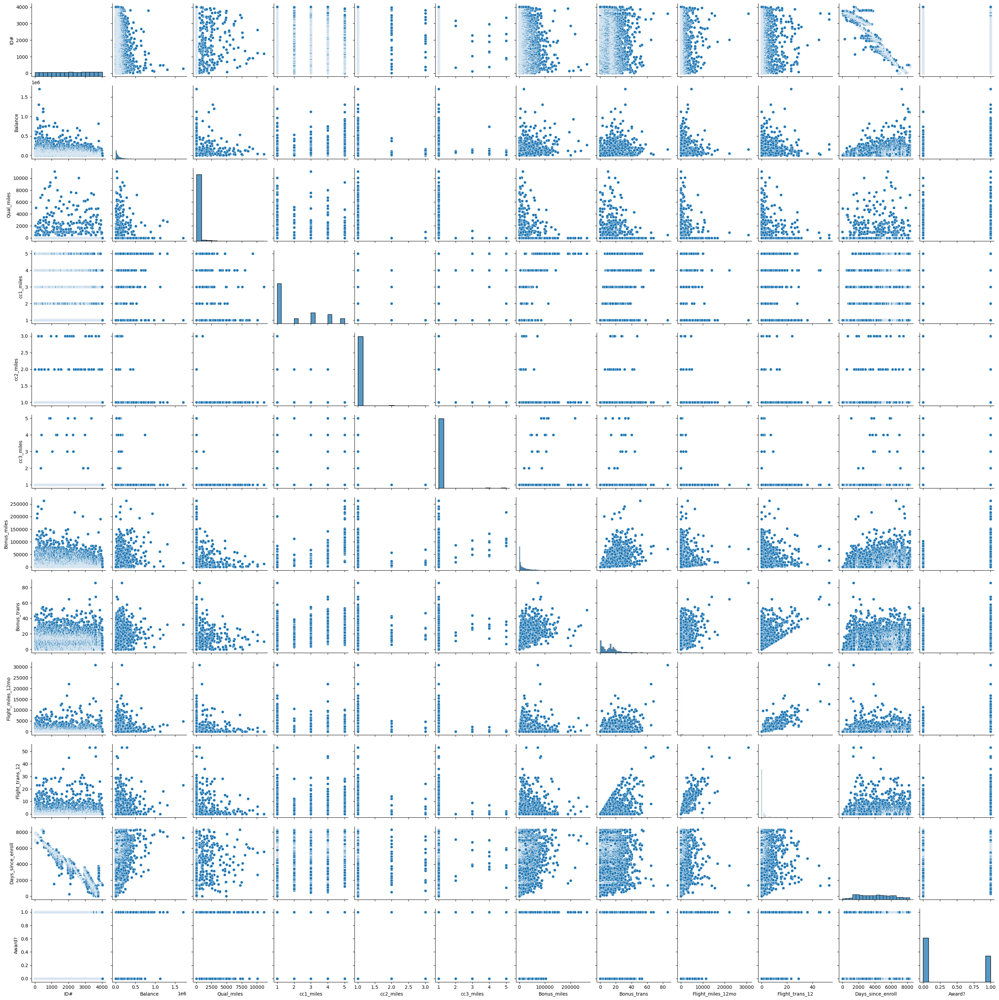

In [6]:
sns.pairplot(airlines)

In [7]:
# Normalization of data values
def norm_func(i):
    x = (i-i.min())/(i.max()-i.min())
    print(x)
    return x

In [8]:
airlines1 = norm_func(airlines)

           ID#   Balance  Qual_miles  cc1_miles  cc2_miles  cc3_miles  \
0     0.000000  0.016508         0.0       0.00        0.0        0.0   
1     0.000249  0.011288         0.0       0.00        0.0        0.0   
2     0.000498  0.024257         0.0       0.00        0.0        0.0   
3     0.000746  0.008667         0.0       0.00        0.0        0.0   
4     0.000995  0.057338         0.0       0.75        0.0        0.0   
...        ...       ...         ...        ...        ...        ...   
3994  0.999005  0.010837         0.0       0.00        0.0        0.0   
3995  0.999254  0.037766         0.0       0.00        0.0        0.0   
3996  0.999502  0.043169         0.0       0.50        0.0        0.0   
3997  0.999751  0.032202         0.0       0.00        0.0        0.0   
3998  1.000000  0.001769         0.0       0.00        0.0        0.0   

      Bonus_miles  Bonus_trans  Flight_miles_12mo  Flight_trans_12  \
0        0.000660     0.011628           0.000000    

# Hierarchical Clustering

In [9]:
# import hierarchical clustering libraries
import scipy.cluster.hierarchy as sch 

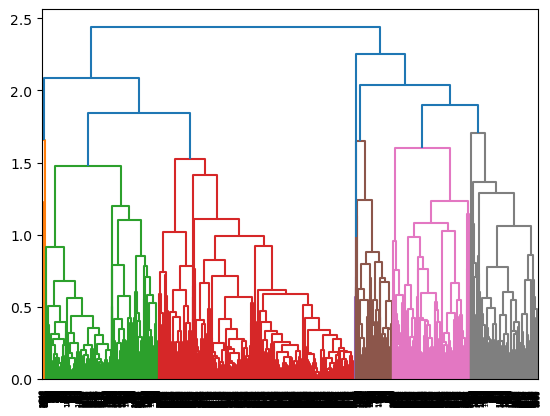

In [11]:
# Creating a dendrogram for hierarchical clustering
dendrogram = sch.dendrogram(sch.linkage(airlines1, method='complete'))

In [12]:
from sklearn.cluster import AgglomerativeClustering

In [13]:
# create clusters
hc = AgglomerativeClustering(n_clusters=5, affinity = 'euclidean', linkage = 'complete',distance_threshold=None)

In [14]:
hc.fit(airlines1)

C:\Users\Aruna\anaconda3\Lib\site-packages\sklearn\cluster\_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


AgglomerativeClustering(affinity='euclidean', linkage='complete', n_clusters=5)

In [15]:
hc_pred = hc.fit_predict(airlines1)

C:\Users\Aruna\anaconda3\Lib\site-packages\sklearn\cluster\_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


In [16]:
hc_pred

array([1, 1, 1, ..., 0, 1, 1], dtype=int64)

In [17]:
set(hc_pred)

{0, 1, 2, 3, 4}

In [18]:
airlines1["hc_id"] = hc_pred

In [19]:
airlines1

,ID#,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,hc_id
0,0.000000,0.016508,0.0,0.00,0.0,0.0,0.000660,0.011628,0.000000,0.000000,0.843742,0.0,1
1,0.000249,0.011288,0.0,0.00,0.0,0.0,0.000815,0.023256,0.000000,0.000000,0.839884,0.0,1
2,0.000498,0.024257,0.0,0.00,0.0,0.0,0.015636,0.046512,0.000000,0.000000,0.847842,0.0,1
3,0.000746,0.008667,0.0,0.00,0.0,0.0,0.001896,0.011628,0.000000,0.000000,0.837955,0.0,1
4,0.000995,0.057338,0.0,0.75,0.0,0.0,0.164211,0.302326,0.067398,0.075472,0.835905,1.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3994,0.999005,0.010837,0.0,0.00,0.0,0.0,0.032330,0.046512,0.006490,0.018868,0.168917,1.0,0
3995,0.999254,0.037766,0.0,0.00,0.0,0.0,0.003720,0.058140,0.000000,0.000000,0.167953,1.0,0
3996,0.999502,0.043169,0.0,0.50,0.0,0.0,0.096505,0.093023,0.000000,0.000000,0.168797,1.0,0
3997,0.999751,0.032202,0.0,0.00,0.0,0.0,0.001896,0.011628,0.016225,0.018868,0.168676,0.0,1


In [23]:
airlines1.sort_values('hc_id')

,ID#,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,hc_id
1999,0.501244,0.191881,0.130248,1.00,0.0,0.0,0.371644,0.290698,0.011357,0.056604,0.535086,1.0,0
1429,0.358706,0.036701,0.000000,0.75,0.0,0.0,0.128051,0.220930,0.001622,0.018868,0.589101,1.0,0
1425,0.357711,0.034336,0.155992,0.75,0.0,0.0,0.184576,0.220930,0.016225,0.037736,0.524476,1.0,0
1423,0.357214,0.015580,0.000000,0.00,0.0,0.0,0.000379,0.011628,0.000000,0.000000,0.593682,1.0,0
2919,0.731343,0.021299,0.000000,0.00,0.0,0.0,0.000379,0.011628,0.003245,0.018868,0.212684,1.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
335,0.084328,0.163333,0.603427,0.75,0.0,0.0,0.217354,0.313953,0.032450,0.037736,0.855920,1.0,4
640,0.161194,0.008927,0.000000,0.00,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.774656,1.0,4
1440,0.361443,0.033978,0.000000,0.00,0.0,0.0,0.005689,0.034884,0.048674,0.056604,0.620569,1.0,4
1078,0.270647,0.001500,0.000000,0.00,0.0,0.0,0.023756,0.116279,0.000000,0.000000,0.672655,1.0,4


In [24]:
airlines1.groupby("hc_id").mean()

,ID#,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
hc_id,,,,,,,,,,,,
0,0.500814,0.053331,0.015875,0.498717,0.002994,0.005346,0.127170,0.193527,0.025073,0.044014,0.500255,1.000000
1,0.539778,0.035177,0.007937,0.178099,0.000201,0.002206,0.038740,0.105771,0.007368,0.012321,0.460745,0.000000
2,0.777861,0.077426,0.031127,0.375000,0.000000,0.000000,0.248912,0.805233,0.647694,0.929245,0.265041,1.000000
3,0.525586,0.032489,0.002563,0.007143,0.714286,0.000000,0.054059,0.190033,0.012936,0.033423,0.498822,0.285714
4,0.170052,0.070999,0.044087,0.102349,0.000000,0.001678,0.039894,0.133214,0.030125,0.055654,0.781433,1.000000


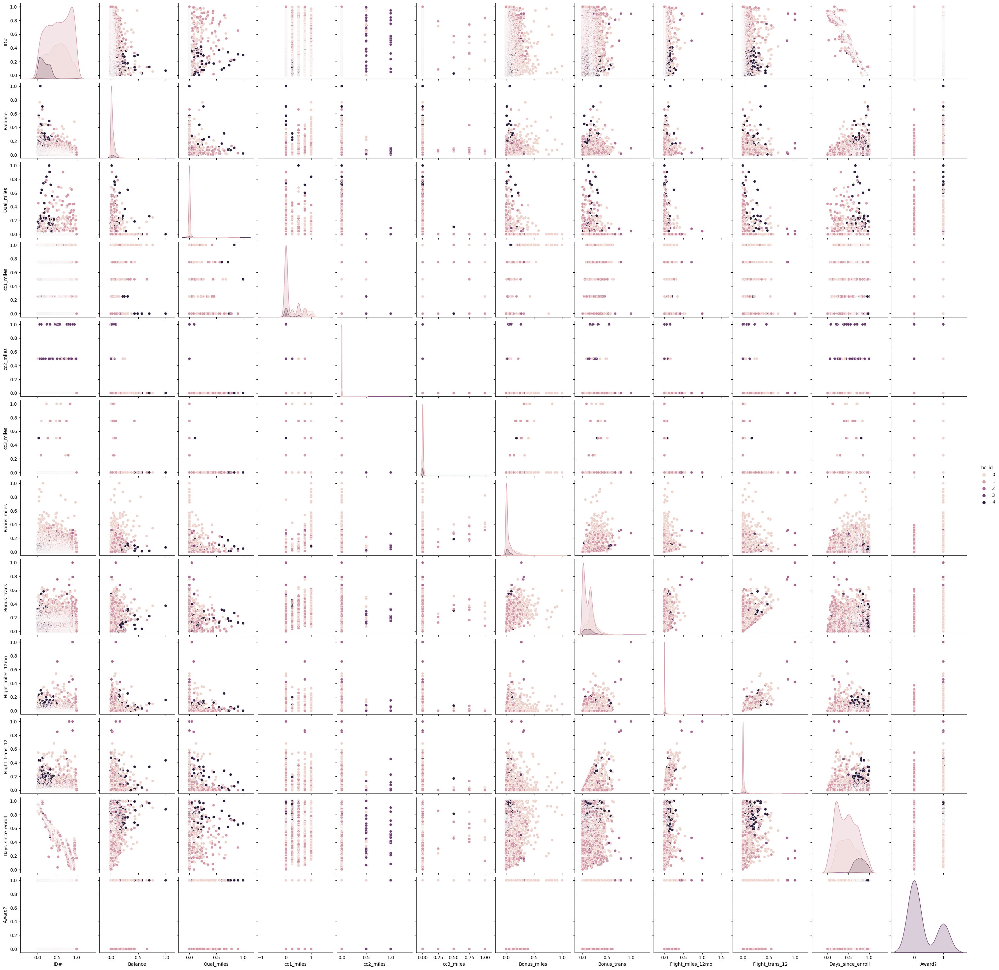

In [25]:
sns.pairplot(data = airlines1, hue="hc_id")

# K-means Clustering

In [26]:
import warnings
warnings.filterwarnings("ignore")
from sklearn.cluster import KMeans

In [ ]:
#The K-means algorithm aims to choose centroids that minimise the inertia, or within-cluster sum-of-squares criterion:

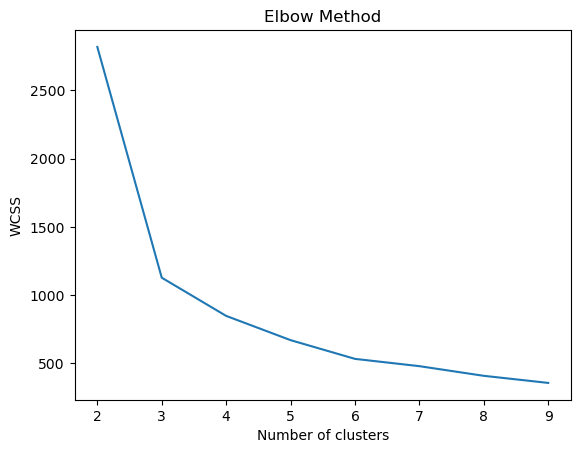

In [27]:
wcss = []
for i in range(2, 10):
    
    kmeans = KMeans(n_clusters=i,random_state=42 )
    kmeans.fit(airlines1)
    wcss.append(kmeans.inertia_)

# plottung Elbow plot
import matplotlib.pyplot as plt
plt.plot(range(2, 10), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

In [28]:
#Building Cluster algorithm
cluster = KMeans(3, random_state=42)
cluster.fit(airlines1)

KMeans(n_clusters=3, random_state=42)

In [29]:
cluster.labels_

array([1, 1, 1, ..., 0, 1, 1])

In [30]:
set(cluster.labels_)

{0, 1, 2}

In [31]:
airlines1["cluster_id"] = cluster.labels_

In [32]:
airlines1

,ID#,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,hc_id,cluster_id
0,0.000000,0.016508,0.0,0.00,0.0,0.0,0.000660,0.011628,0.000000,0.000000,0.843742,0.0,1,1
1,0.000249,0.011288,0.0,0.00,0.0,0.0,0.000815,0.023256,0.000000,0.000000,0.839884,0.0,1,1
2,0.000498,0.024257,0.0,0.00,0.0,0.0,0.015636,0.046512,0.000000,0.000000,0.847842,0.0,1,1
3,0.000746,0.008667,0.0,0.00,0.0,0.0,0.001896,0.011628,0.000000,0.000000,0.837955,0.0,1,1
4,0.000995,0.057338,0.0,0.75,0.0,0.0,0.164211,0.302326,0.067398,0.075472,0.835905,1.0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3994,0.999005,0.010837,0.0,0.00,0.0,0.0,0.032330,0.046512,0.006490,0.018868,0.168917,1.0,0,0
3995,0.999254,0.037766,0.0,0.00,0.0,0.0,0.003720,0.058140,0.000000,0.000000,0.167953,1.0,0,0
3996,0.999502,0.043169,0.0,0.50,0.0,0.0,0.096505,0.093023,0.000000,0.000000,0.168797,1.0,0,0
3997,0.999751,0.032202,0.0,0.00,0.0,0.0,0.001896,0.011628,0.016225,0.018868,0.168676,0.0,1,1


In [37]:
airlines2 =airlines1.drop('hc_id',axis=1)

In [34]:
# These are Standerdized values
cluster_center = cluster.cluster_centers_
cluster_center

array([[ 5.00813937e-01,  5.33308227e-02,  1.58747552e-02,
         4.98716852e-01,  2.99401198e-03,  5.34644996e-03,
         1.27169769e-01,  1.93526568e-01,  2.50732039e-02,
         4.40143971e-02,  5.00255474e-01,  1.00000000e+00,
        -5.44009282e-15],
       [ 5.40159037e-01,  3.52448827e-02,  7.97408271e-03,
         1.78414097e-01,  2.00240288e-04,  2.20264317e-03,
         3.90764535e-02,  1.06891060e-01,  8.39367887e-03,
         1.37901331e-02,  4.60431901e-01,  1.60192231e-03,
         1.00160192e+00],
       [ 2.07420107e-01,  6.69512558e-02,  3.97229846e-02,
         9.23423423e-02,  7.50750751e-02,  1.50150150e-03,
         4.13823916e-02,  1.39185697e-01,  2.83183856e-02,
         5.33174684e-02,  7.51729062e-01,  9.24924925e-01,
         3.89489489e+00]])

In [38]:
# Quality of clusters is expressed in terms of Silhoutte score

from sklearn.metrics import silhouette_score
score =silhouette_score(airlines2, kmeans.labels_ , metric='euclidean')
score

0.4555901971346776

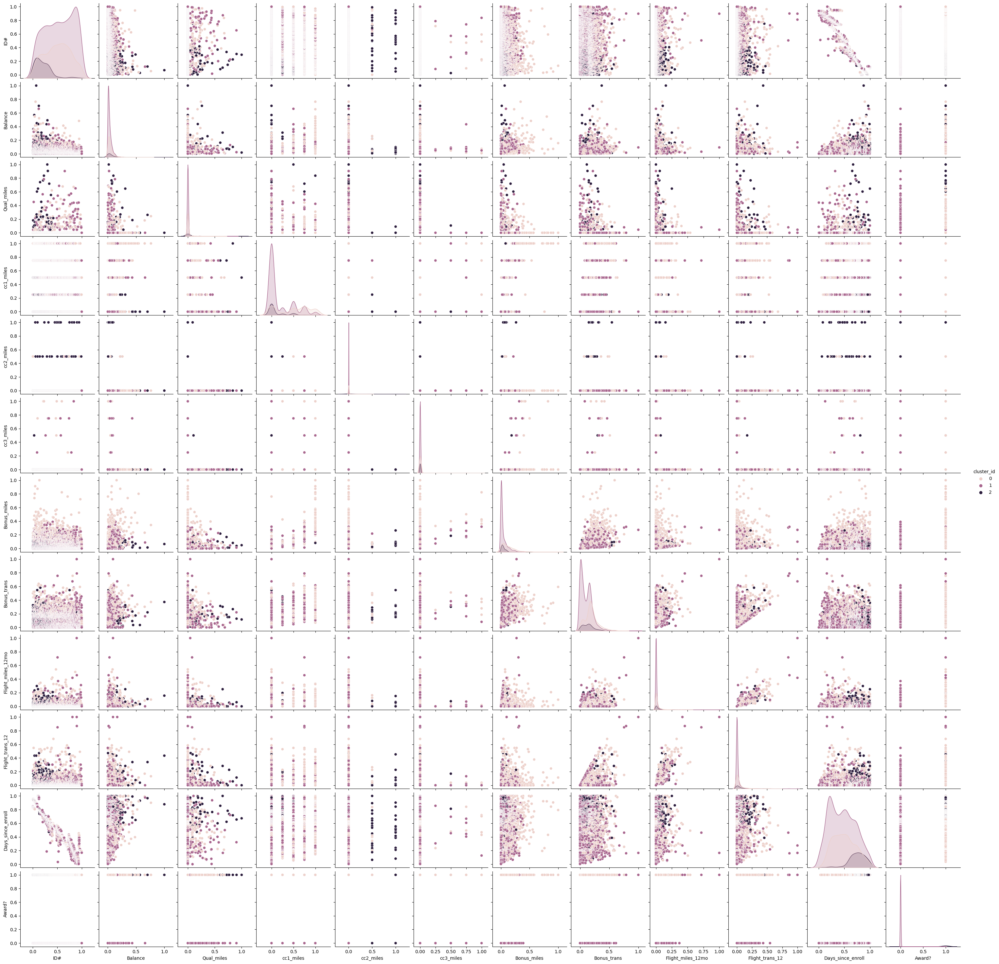

In [39]:
sns.pairplot(data=airlines2, hue="cluster_id")

# DBSCAN

In [40]:
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler

In [42]:
airline = pd.read_csv(r"C:\Users\Aruna\Desktop\Assgnmnts-DS\Clustering-7\EastWestAirlines.csv")

In [43]:
airline.head()

,ID#,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
0,1,28143,0,1,1,1,174,1,0,0,7000,0
1,2,19244,0,1,1,1,215,2,0,0,6968,0
2,3,41354,0,1,1,1,4123,4,0,0,7034,0
3,4,14776,0,1,1,1,500,1,0,0,6952,0
4,5,97752,0,4,1,1,43300,26,2077,4,6935,1


In [44]:
array1 = airline.values
array1

array([[    1, 28143,     0, ...,     0,  7000,     0],
       [    2, 19244,     0, ...,     0,  6968,     0],
       [    3, 41354,     0, ...,     0,  7034,     0],
       ...,
       [ 4019, 73597,     0, ...,     0,  1402,     1],
       [ 4020, 54899,     0, ...,     1,  1401,     0],
       [ 4021,  3016,     0, ...,     0,  1398,     0]], dtype=int64)

In [46]:
scaler = StandardScaler()
X = scaler.fit_transform(array1)

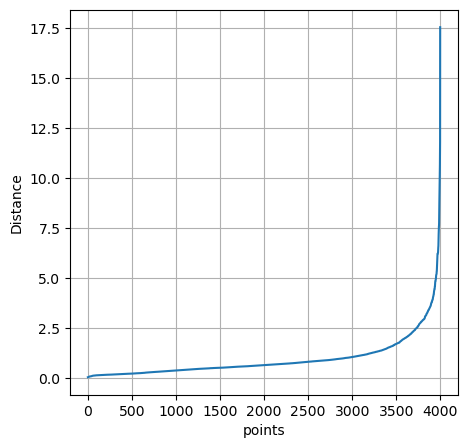

In [47]:
from sklearn.neighbors import NearestNeighbors
import numpy as np
import matplotlib.pyplot as plt
nearest_neighbors = NearestNeighbors(n_neighbors=20)
neighbors = nearest_neighbors.fit(X)

distances, indices = neighbors.kneighbors(X)
distances=np.sort(distances[:,10],axis=0)
fig=plt.figure(figsize=(5, 5))
plt.plot(distances)
plt.xlabel("points")
plt.ylabel("Distance")
plt.grid()

In [48]:
dbscan = DBSCAN(eps=1.30, min_samples=5)
dbclusters = dbscan.fit_predict(X)

In [49]:
dbscan.labels_

array([0, 0, 0, ..., 1, 0, 0], dtype=int64)

In [50]:
airline["cluster_labels"] = dbscan.labels_

In [51]:
airline.head()

,ID#,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,cluster_labels
0,1,28143,0,1,1,1,174,1,0,0,7000,0,0
1,2,19244,0,1,1,1,215,2,0,0,6968,0,0
2,3,41354,0,1,1,1,4123,4,0,0,7034,0,0
3,4,14776,0,1,1,1,500,1,0,0,6952,0,0
4,5,97752,0,4,1,1,43300,26,2077,4,6935,1,1


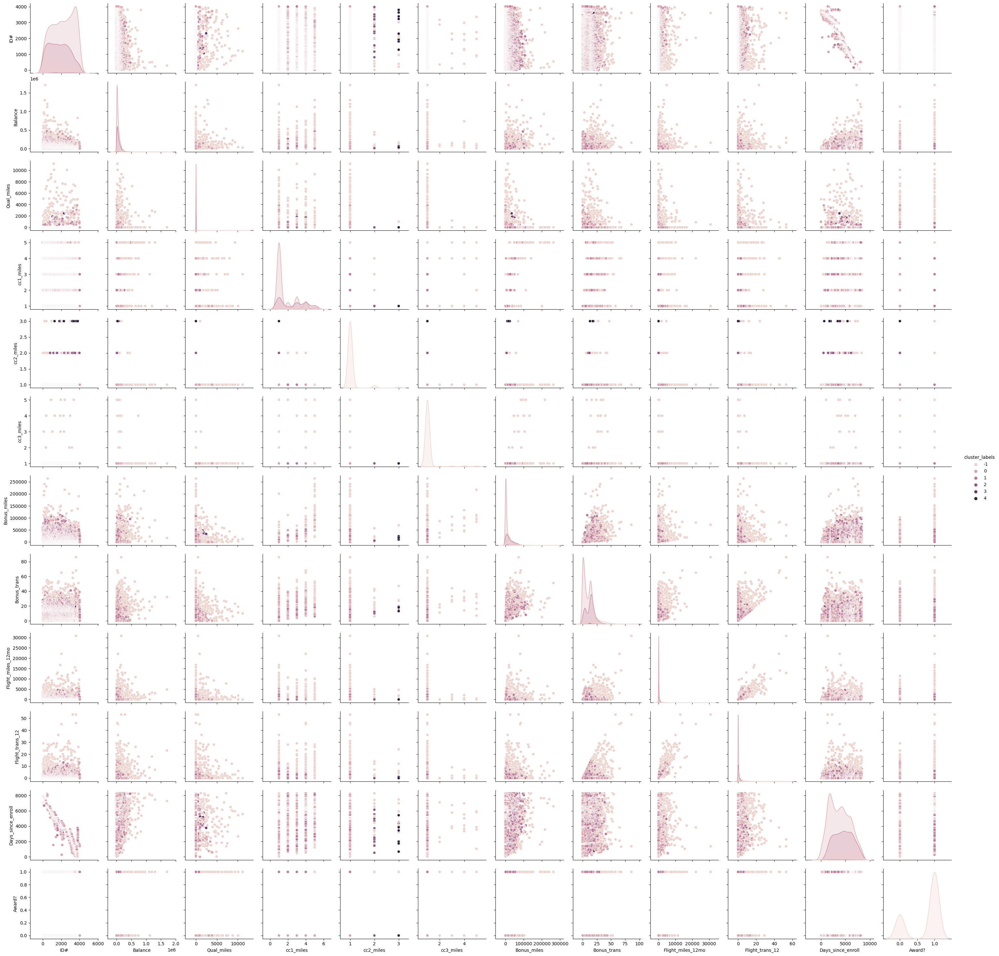

In [52]:
sns.pairplot(data = airline, hue="cluster_labels")